1. Import Library

In [18]:
import os
import re
import math
import random
import shutil
import hashlib

from pathlib import Path
from collections import defaultdict, Counter

import numpy as np
import pandas as pd

import cv2
from PIL import Image

import matplotlib.pyplot as plt

from tqdm import tqdm

2. Dataset Overview

This is an object detection dataset containing annotated images of Indonesian dishes across multiple classes. The dataset contains bounding box annotations with varying distribution across classes and images.

In [19]:
DATASET_ROOT = Path(r"dataset")
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

total_images = 0
total_boxes = 0
class_names = set()   

for cls in DATASET_ROOT.iterdir():
    if not cls.is_dir():
        continue

    img_dir = cls / "images"
    lbl_dir = cls / "labels"
    if not img_dir.exists() or not lbl_dir.exists():
        continue

    images = [p for p in img_dir.iterdir() if p.suffix.lower() in IMG_EXTS]
    labels = list(lbl_dir.glob("*.txt"))

    total_images += len(images)
    class_names.add(cls.name)

    for lbl in labels:
        try:
            lines = [ln for ln in lbl.read_text(encoding="utf-8").splitlines() if ln.strip()]
            total_boxes += len(lines)
        except Exception:
            continue

print("=== DATASET SUMMARY ===")
print(f"Classes        : {len(class_names)}")
print(f"Images         : {total_images}")
print(f"Bounding boxes : {total_boxes}")

=== DATASET SUMMARY ===
Classes        : 40
Images         : 6590
Bounding boxes : 11110


3. Dataset Integrity Checks

Dataset integrity checks are performed to ensure consistency between images and annotations, validate class indexing, and identify corrupt or invalid files that could negatively affect training and evaluation.

In [20]:
DATASET_ROOT = Path(r"dataset")
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}


# MD5 hash → detects exact binary duplicates (content-based)
# ------------------------------
def file_hash(path: Path, chunk_size=8192):
    h = hashlib.md5()
    with open(path, "rb") as f:
        while chunk := f.read(chunk_size):
            h.update(chunk)
    return h.hexdigest()

def read_yolo_lines(label_path: Path):
    with open(label_path, "r", encoding="utf-8") as f:
        return [ln.strip() for ln in f if ln.strip()]


missing_label = []
missing_image = []
empty_labels = []
invalid_yolo = []
corrupted_images = []

# per-class image hashes
image_hashes = defaultdict(lambda: defaultdict(list))

total_images = 0
total_labels = 0


for cls in sorted(
    [p for p in DATASET_ROOT.iterdir() if p.is_dir() and not p.name.startswith("_")],
    key=lambda p: p.name.lower()
):
    class_name = cls.name

    img_dir = cls / "images"
    lbl_dir = cls / "labels"
    if not img_dir.exists() or not lbl_dir.exists():
        continue

    images = [p for p in img_dir.iterdir() if p.suffix.lower() in IMG_EXTS]
    labels = list(lbl_dir.glob("*.txt"))

    total_images += len(images)
    total_labels += len(labels)

    img_map = {p.stem: p for p in images}
    lbl_map = {p.stem: p for p in labels}


    # Missing pairs
    # -------------------------
    for stem, img_path in img_map.items():
        if stem not in lbl_map:
            missing_label.append(str(img_path.resolve()))

    for stem, lbl_path in lbl_map.items():
        if stem not in img_map:
            missing_image.append(str(lbl_path.resolve()))


    # Image checks + per-class duplicates
    # -------------------------
    for img_path in images:
        try:
            img = cv2.imread(str(img_path))
            if img is None or img.size == 0:
                corrupted_images.append(str(img_path.resolve()))
                continue
        except Exception:
            corrupted_images.append(str(img_path.resolve()))
            continue

        h = file_hash(img_path)
        image_hashes[class_name][h].append(str(img_path.resolve()))


    # Label checks (NO duplicate detection)
    # -------------------------
    for lbl_path in labels:
        lines = read_yolo_lines(lbl_path)

        if len(lines) == 0:
            empty_labels.append(str(lbl_path.resolve()))
            continue

        for ln in lines:
            parts = ln.split()
            if len(parts) != 5:
                invalid_yolo.append((str(lbl_path.resolve()), ln))
                continue

            try:
                _, x, y, w, h = parts
                x, y, w, h = map(float, (x, y, w, h))
            except Exception:
                invalid_yolo.append((str(lbl_path.resolve()), ln))
                continue

            if not (0 < x <= 1 and 0 < y <= 1 and 0 < w <= 1 and 0 < h <= 1):
                invalid_yolo.append((str(lbl_path.resolve()), ln))


# PER-CLASS DUPLICATES
# =========================
dup_images = {}

for cls_name, hashes in image_hashes.items():
    for h, files in hashes.items():
        if len(files) > 1:
            dup_images.setdefault(cls_name, []).append(files)


# FULL REPORT
# =========================

print(f"Total images scanned : {total_images}")
print(f"Total labels scanned : {total_labels}")
print("-" * 100)

print(f"❌ Missing labels ({len(missing_label)}):")
for p in missing_label:
    print(p)
print("-" * 100)

print(f"❌ Missing images ({len(missing_image)}):")
for p in missing_image:
    print(p)
print("-" * 100)

print(f"⚠ Empty label files ({len(empty_labels)}):")
for p in empty_labels:
    print(p)
print("-" * 100)

print(f"❌ Invalid YOLO entries ({len(invalid_yolo)}):")
for p, ln in invalid_yolo:
    print(f"{p}  |  {ln}")
print("-" * 100)

print(f"❌ Corrupted images ({len(corrupted_images)}):")
for p in corrupted_images:
    print(p)
print("-" * 100)

print("⚠ Duplicate image groups (PER CLASS):")
for cls_name, groups in dup_images.items():
    print(f"\nClass: {cls_name}")
    for group in groups:
        for f in group:
            print(" ", f)
        print("-" * 50)

print("=" * 100)

Total images scanned : 6590
Total labels scanned : 6589
----------------------------------------------------------------------------------------------------
❌ Missing labels (1):
C:\Users\nicho\Dokumen\Projects\REAL\src\dataset\0 (tempe goreng)\images\tempe-goreng-krispy-foto-resep-utama_jpg.rf.ceb0b9fa7925f4c7b2d25f19f0b8a71f.jpg
----------------------------------------------------------------------------------------------------
❌ Missing images (0):
----------------------------------------------------------------------------------------------------
⚠ Empty label files (1):
C:\Users\nicho\Dokumen\Projects\REAL\src\dataset\35 (martabak manis)\labels\apam_balik_173_jpg.rf.6b3e7991e29e6ab05f5e85dcc54f7ace.txt
----------------------------------------------------------------------------------------------------
❌ Invalid YOLO entries (0):
----------------------------------------------------------------------------------------------------
❌ Corrupted images (0):
-----------------------------

Duplicate images were identified using content-based hashing. Each image file was hashed using the MD5 algorithm, and images producing identical hash values within the same class were considered duplicates. This approach detects exact duplicate images regardless of filename differences.

Integrity checks revealed minor inconsistencies including missing labels, empty label files, invalid YOLO entries/format, and duplicate image groups(per class). These issues are to be solved prior to training in prepreocessing to ensure dataset reliability.

4. Analyze Dataset

4.1 Dataset Statistics

This section presents a quantitative overview of the dataset after conversion and integrity verification. The objective is to summarize the scale, composition, and structural characteristics of the dataset prior to model training.

In [21]:
DATASET_ROOT = Path("dataset")
LABEL_DIR_NAME = "labels"
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}


class_stats = []
resolution_counter = Counter()
box_count_per_image = []

for cls in sorted(DATASET_ROOT.iterdir()):
    if not cls.is_dir():
        continue

    img_dir = cls / "images"
    lbl_dir = cls / LABEL_DIR_NAME
    if not img_dir.exists() or not lbl_dir.exists():
        continue

    images = [p for p in img_dir.iterdir() if p.suffix.lower() in IMG_EXTS]
    labels = list(lbl_dir.glob("*.txt"))

    img_map = {p.stem: p for p in images}

    total_boxes = 0

    for lbl in labels:
        img = img_map.get(lbl.stem)
        if img is None:
            continue

        with open(lbl, "r") as f:
            lines = [ln for ln in f if ln.strip()]
        num_boxes = len(lines)

        total_boxes += num_boxes
        box_count_per_image.append(num_boxes)

        im = cv2.imread(str(img))
        if im is not None:
            h, w = im.shape[:2]
            resolution_counter[(w, h)] += 1

    class_stats.append({
        "class": cls.name,
        "images": len(images),
        "total_boxes": total_boxes,
        "avg_boxes_per_image": round(total_boxes / len(images), 3) if images else 0
    })

4.2 Create DataFrames & Table Output

This subsection summarizes key dataset statistics using structured tables derived from the converted and validated dataset. The tables provide insights into class representation, image resolution variability, and object density per image.

In [22]:
df_classes = pd.DataFrame(class_stats).sort_values(
    by="images", ascending=False
)

df_resolutions = (
    pd.DataFrame(
        [{"width": w, "height": h, "count": c}
         for (w, h), c in resolution_counter.items()]
    )
    .sort_values("count", ascending=False)
)

df_boxes = pd.DataFrame(
    Counter(box_count_per_image).items(),
    columns=["boxes_per_image", "frequency"]
).sort_values("boxes_per_image")

In [23]:
print("\n=== Images & Boxes per Class ===")
display(df_classes.style.hide(axis="index"))

print("\n=== Image Resolution Distribution (Top 10) ===")
display(df_resolutions.head(10).style.hide(axis="index"))
# display(df_resolutions.style.hide(axis="index")) -> to print ALL image resolutions

print("\n=== Box Count per Image ===")
display(df_boxes.style.hide(axis="index"))



=== Images & Boxes per Class ===


class,images,total_boxes,avg_boxes_per_image
10 (nasi goreng),327,334,1.021000
4 (sate),321,344,1.072000
2 (rendang),299,310,1.037000
31 (pempek),298,641,2.151000
5 (bakso),293,363,1.239000
9 (mie goreng),241,241,1.000000
22 (nasi putih),232,233,1.004000
34 (telur rebus),200,422,2.110000
21 (telur ceplok),199,214,1.075000
24 (putu ayu),190,1169,6.153000



=== Image Resolution Distribution (Top 10) ===


width,height,count
500,500,486
640,640,424
577,433,301
751,532,253
800,600,198
512,512,159
500,375,157
680,482,114
1280,720,108
1200,630,99



=== Box Count per Image ===


boxes_per_image,frequency
0,1
1,5106
2,563
3,318
4,168
5,130
6,100
7,59
8,36
9,29


The table “Images & Boxes per Class” summarizes the number of images, total bounding boxes, and average number of objects per image for each food category.

The dataset exhibits moderate class imbalance:
- Most represented classes: Bakso (409 images), Sate (361 images), Martabak Manis (344 images)
- Least represented classes: Tempe Goreng (91 images), Bakwan (104 images), Gado Gado (105 images)
- Imbalance ratio: ~4.5x difference between most and least frequent classes
- Assessment: This is a manageable imbalance, not severe. Real-world datasets often have 10x+ or even 100x+ imbalance (ImageNet, COCO). Therefore, the impact of it is quite minimal. Stratified train/val splits will be used to ensure representation.

The “Image Resolution Distribution” table reports the ten most frequent image resolutions observed in the dataset.

The dataset contains a wide range of image sizes, with the most common resolutions being 500×500 (481 images) and 640×640 (480 images), followed by 800×600 (345 images) and 751×532 (322 images). Additional resolutions such as 512×512, 1280×720, and 1200×630 further reflect variability in image acquisition sources. Although many unique resolutions exist, a limited number of dominant resolutions account for a large proportion of the dataset. This heterogeneity motivates the use of standardized resizing to ensure consistent input dimensions for model training. 

The “Box Count per Image” table summarizes the distribution of object counts per image.

Most images contain a single object, with 3,967 images annotated with exactly one bounding box. Images containing two and three objects occur less frequently, with 616 and 338 images respectively. Notably, a substantial number of images (1,747 images) contain five objects, indicating the presence of shared meals or composite food scenes. A small number of extreme cases contain a very high number of objects, with isolated images annotated with up to 60 bounding boxes. While rare, these outliers introduce challenging detection scenarios that may impact training stability and evaluation metrics.

Upon further inspection, these outliers were found to originate from samples annotated using YOLO segmentation format, where polygon-based annotations were inadvertently interpreted as multiple bounding boxes during preprocessing. As a result, these high object counts do not necessarily correspond to true object density, but rather reflect annotation format inconsistencies within the dataset. These issues are to be solved prior to training in prepreocessing to ensure dataset reliability.


Overall Observations (Summary)

From the tabular analysis, several important dataset characteristics emerge:

- An approximate 4.5× class imbalance is observed across categories, with classes such as bakso and sate dominating the dataset. Despite this imbalance, it remains within a manageable range and not severe.

- Object density varies significantly across classes, with some categories consistently appearing in multi-object scenes.

- Image resolutions are heterogeneous, necessitating standardized resizing prior to training.

These properties provide essential context for interpreting model performance and motivate the use of robust evaluation metrics in subsequent experiments.

5 Plot & Analyze

5.1 Class Distribution

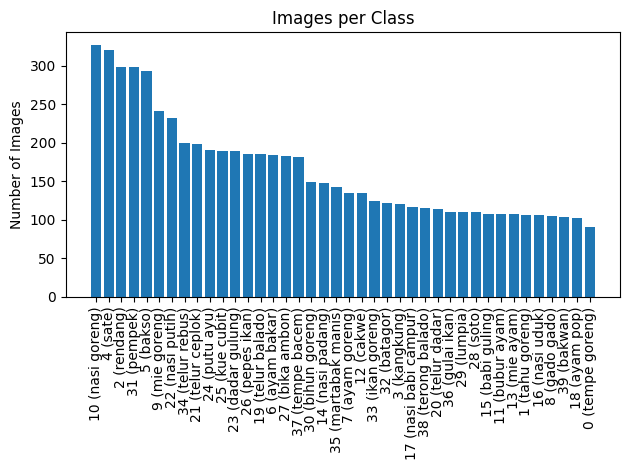

In [24]:
import matplotlib.pyplot as plt

plt.figure()
plt.bar(df_classes["class"], df_classes["images"])
plt.xticks(rotation=90)
plt.title("Images per Class")
plt.ylabel("Number of Images")
plt.tight_layout()
plt.show()


The figure illustrates the distribution of images per class, sorted in descending order to emphasize disparities in class representation. The dataset exhibits a long-tailed distribution, where a small number of food categories dominate the dataset while most classes contain substantially fewer images.

Classes such as bakso, sate, martabak manis, and nasi goreng are the most represented, each containing over 300 images, whereas many categories have approximately 100 images or fewer. Notably, common foods such as tempe goreng and tahu goreng fall within this lower-frequency group despite their visual similarity to more dominant classes.

This imbalance could results in uneven exposure to visual variations during training and is expected to yield stronger detection performance for frequent classes while limiting performance on underrepresented categories. Consequently, class imbalance is a key dataset characteristic influencing per-class detection results discussed later.

5.2 Bounding Box Count Distribution

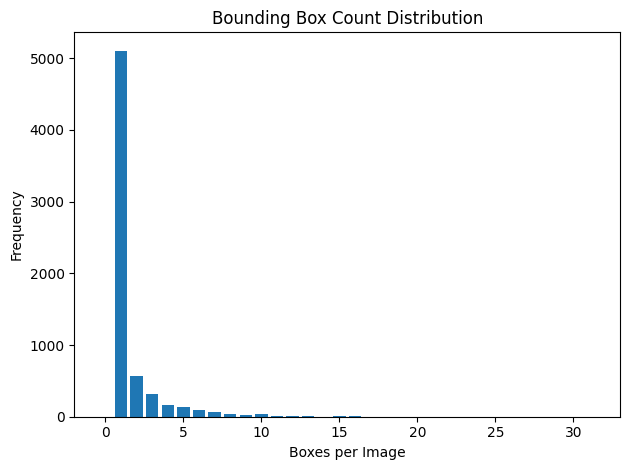

In [25]:
plt.figure()
plt.bar(df_boxes["boxes_per_image"], df_boxes["frequency"])
plt.xlabel("Boxes per Image")
plt.ylabel("Frequency")
plt.title("Bounding Box Count Distribution")
plt.tight_layout()
plt.show()

The figure shows the distribution of bounding boxes per image. The distribution is right-skewed, with most images containing one or two objects, representing simpler detection scenarios where individual food items are clearly visible.

A smaller portion of the dataset contains images with higher object density, ranging from five to over 30 bounding boxes per image. These images correspond to more complex scenes, such as shared meals or buffet-style presentations, where multiple food items appear simultaneously and may overlap.

The long-tailed nature of the distribution indicates the presence of extreme outliers with very high object counts. Although rare, these cases introduce challenging detection conditions that can increase localization difficulty and class confusion, potentially reducing detection performance for smaller or visually similar items.

5.3 Top 10 Image Resolution

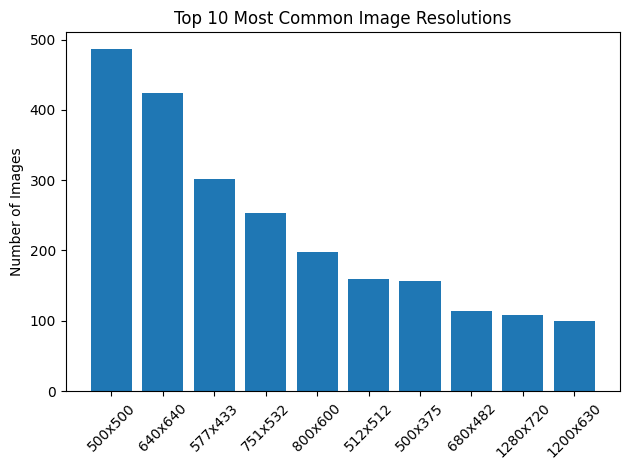

In [26]:
TOP_N = 10

top_res = df_resolutions.head(TOP_N)

plt.figure()
plt.bar(
    [f"{w}x{h}" for w, h in zip(top_res["width"], top_res["height"])],
    top_res["count"]
)
plt.xticks(rotation=45)
plt.title(f"Top {TOP_N} Most Common Image Resolutions")
plt.ylabel("Number of Images")
plt.tight_layout()
plt.show()

The figure summarizes the ten most frequent image resolutions in the dataset, ranked by image count, highlighting variability arising from heterogeneous data sources. The most common resolutions are 500×500 and 640×640, each accounting for nearly 500 images, followed by several mid-sized resolutions such as 800×600, 751×532, and 577×433.

The presence of both square and rectangular resolutions, including 1280×720 and 1200×630, reflects diverse acquisition conditions and aspect ratios typical of web-scraped and camera-captured images. While many unique resolutions exist, the top ten account for a substantial portion of the dataset and are therefore emphasized for clarity.

6. Multi-class & Label Complexity Analysis

6.1 Multi-class Image Breakdown

This analysis examines the number of unique object classes present per image by scanning label files and extracting the set of class IDs associated with each image. The resulting distribution is summarized in the table below.

In [27]:
image_class_counts = Counter()
multi_class_images = []
co_occurrence = Counter()

for cls in DATASET_ROOT.iterdir():
    if not cls.is_dir():
        continue

    lbl_dir = cls / LABEL_DIR_NAME
    if not lbl_dir.exists():
        continue

    for lbl in lbl_dir.glob("*.txt"):
        with open(lbl, "r") as f:
            lines = [ln.strip() for ln in f if ln.strip()]

        classes = set()

        for ln in lines:
            parts = ln.split()
            if len(parts) < 1:
                continue
            classes.add(int(parts[0]))

        num_classes = len(classes)
        image_class_counts[num_classes] += 1

        if num_classes > 1:
            multi_class_images.append(lbl)
            co_occurrence[tuple(sorted(classes))] += 1


 Table Summary

In [28]:
df_class_complexity = pd.DataFrame(
    image_class_counts.items(),
    columns=["num_classes_in_image", "total_images"]
).sort_values("num_classes_in_image")

display(df_class_complexity.style.hide(axis="index"))

num_classes_in_image,total_images
0,1
1,6588


The dataset is overwhelmingly dominated by single-class images, with 6,974 images containing objects from only one class.Multi-class images are comparatively rare: 164 images contain two classes, 18 images contain three classes, and fewer than ten images contain four or more classes, with a single image containing up to five distinct categories. One image contains no labeled objects, likely due to an annotation anomaly which has been detected in the prior analysis.

Overall, the class-set analysis reveals that the dataset is structurally biased toward single-class images. This characteristic simplifies the detection task for most samples but may limit the model’s ability to generalize to complex real-world scenarios involving multiple distinct food categories within the same image.

6.2 Single vs Multi-class Image Ratio

In [29]:
total_images = sum(image_class_counts.values())
single_class = image_class_counts.get(1, 0)
multi_class = total_images - single_class

df_single_multi = pd.DataFrame([
    {"category": "Single-class images", "count": single_class},
    {"category": "Multi-class images (>1)", "count": multi_class}
])

display(df_single_multi.style.hide(axis="index"))


category,count
Single-class images,6588
Multi-class images (>1),1


As shown in the table above, the dataset is strongly dominated by single-class images, with 6,974 images containing objects from only one food category. In contrast, only 189 images contain objects from multiple classes, accounting for a small fraction of the dataset.

This imbalance indicates that the model is predominantly trained on single-category scenes, which simplifies the learning task but limits exposure to complex multi-class co-occurrence scenarios. Consequently, detection performance is expected to be more robust for isolated food items, while generalization to multi-food scenes may be comparatively weaker.

7. Visual Validation (YOLO BOX Check)

Visual validation is conducted by overlaying YOLO-format bounding boxes on randomly sampled images to verify alignment, class correctness, and coordinate validity. This process aims to ensure that bounding boxes are correctly localized, properly scaled, and aligned with their corresponding food objects.

In [30]:
DATASET_ROOT = Path("dataset")
LABEL_DIR_NAME = "labels"
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

SAMPLES_PER_CLASS = 1     
MAX_MULTI_BOX_SAMPLES = 4
MAX_EDGE_CASE_SAMPLES = 4

In [31]:
def draw_yolo_boxes(img_path, label_path):
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    with open(label_path, "r") as f:
        lines = [ln.strip() for ln in f if ln.strip()]

    for ln in lines:
        parts = ln.split()

        if len(parts) != 5:
            continue

        _, xc, yc, bw, bh = map(float, parts)

        x1 = int((xc - bw / 2) * w)
        y1 = int((yc - bh / 2) * h)
        x2 = int((xc + bw / 2) * w)
        y2 = int((yc + bh / 2) * h)

        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

    return img

7.1 Single Box Inspection

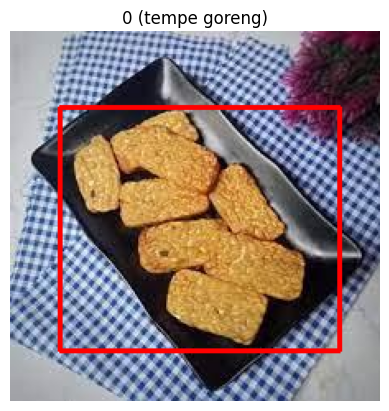

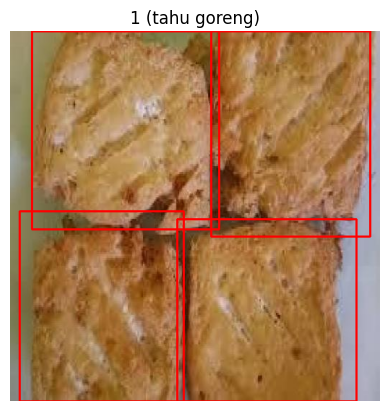

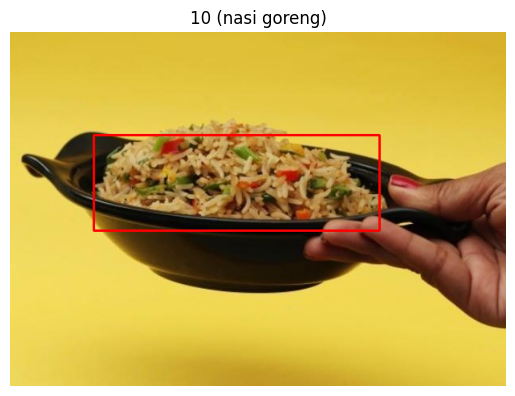

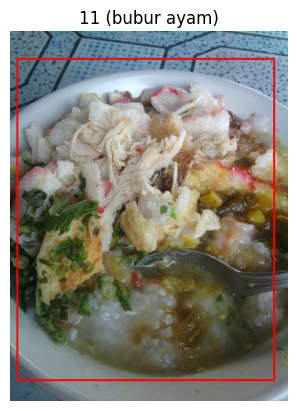

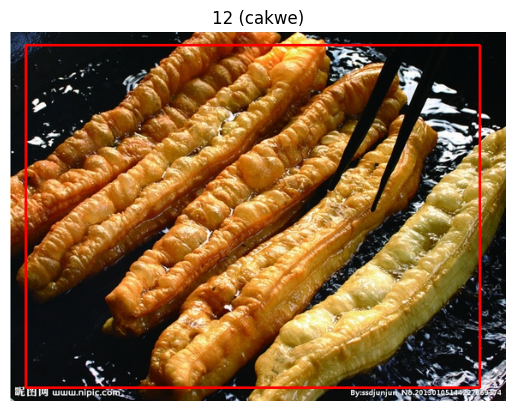

...

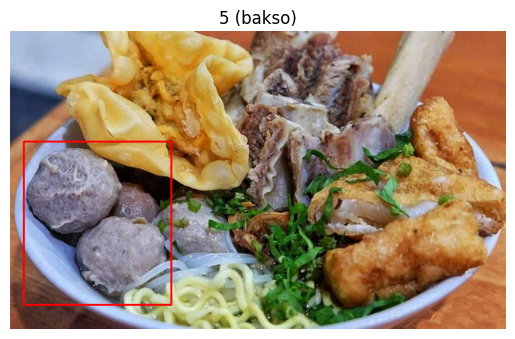

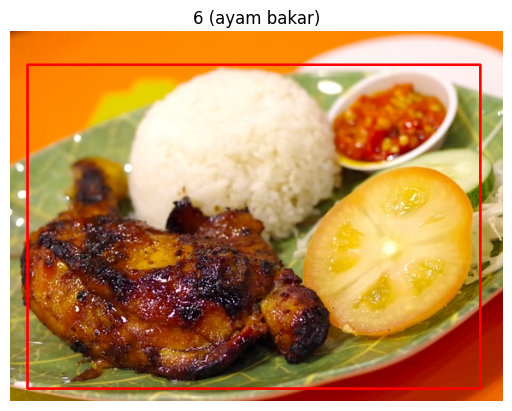

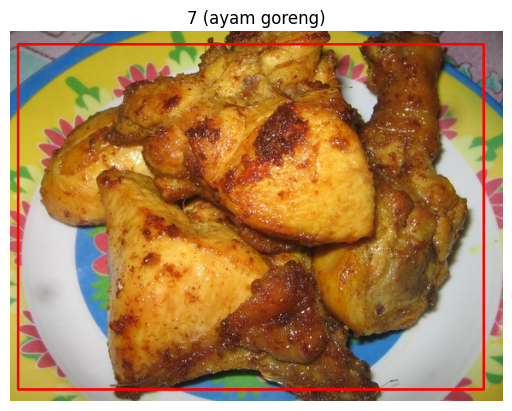

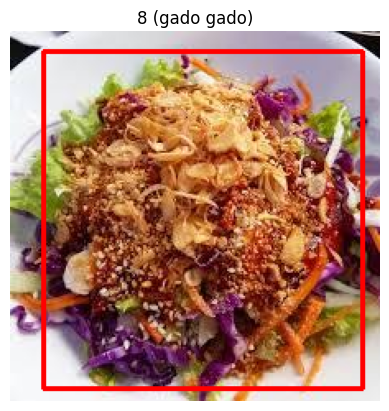

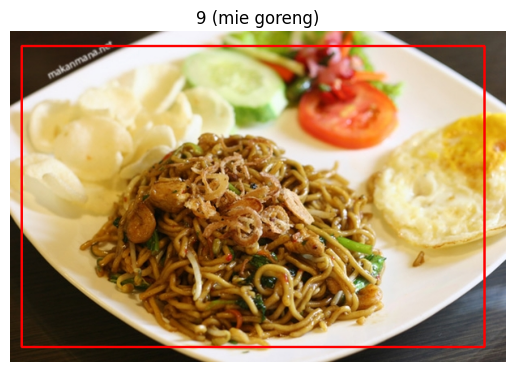

In [32]:
for cls in sorted(DATASET_ROOT.iterdir()):
    if not cls.is_dir():
        continue

    img_dir = cls / "images"
    lbl_dir = cls / LABEL_DIR_NAME
    if not img_dir.exists() or not lbl_dir.exists():
        continue

    images = [p for p in img_dir.iterdir() if p.suffix.lower() in IMG_EXTS]
    if not images:
        continue

    img_path = random.choice(images)
    lbl_path = lbl_dir / f"{img_path.stem}.txt"
    if not lbl_path.exists():
        continue

    img = draw_yolo_boxes(img_path, lbl_path)

    plt.figure()
    plt.imshow(img)
    plt.title(cls.name)
    plt.axis("off")
    plt.show()

7.2 Multi Box Inspection

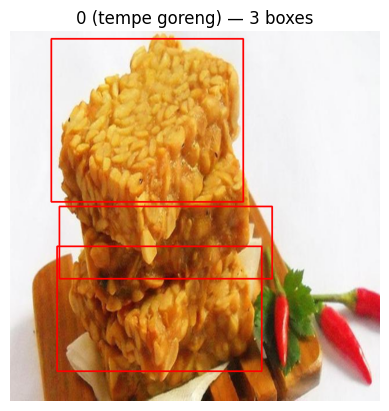

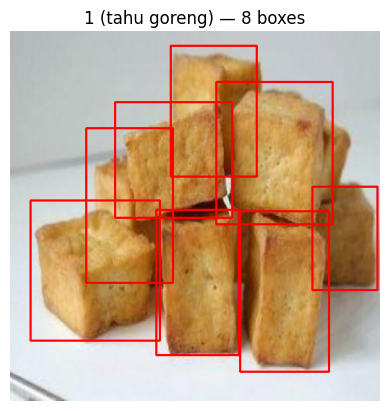

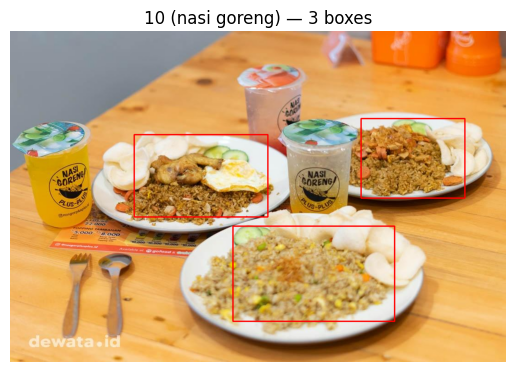

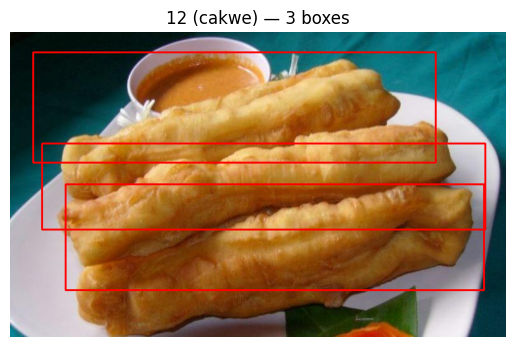

In [33]:
shown = 0

for cls in DATASET_ROOT.iterdir():
    if shown >= MAX_MULTI_BOX_SAMPLES:
        break

    lbl_dir = cls / LABEL_DIR_NAME
    img_dir = cls / "images"
    if not lbl_dir.exists():
        continue

    for lbl in lbl_dir.glob("*.txt"):
        with open(lbl, "r") as f:
            lines = [ln.strip() for ln in f if ln.strip() and len(ln.split()) == 5]

        if len(lines) >= 2:
            img_path = img_dir / f"{lbl.stem}.jpg"
            if not img_path.exists():
                continue

            img = draw_yolo_boxes(img_path, lbl)
            plt.figure()
            plt.imshow(img)
            plt.title(f"{cls.name} — {len(lines)} boxes")
            plt.axis("off")
            plt.show()

            shown += 1
            break

7.3 Small Box Inspection

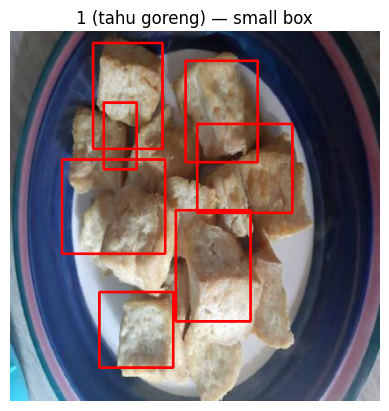

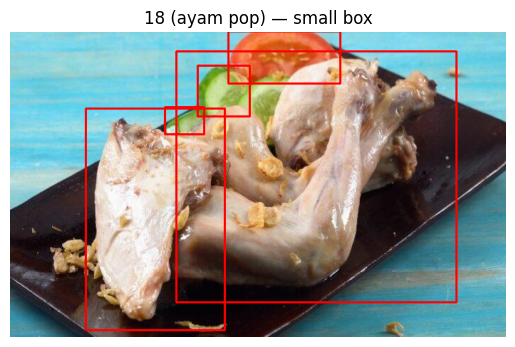

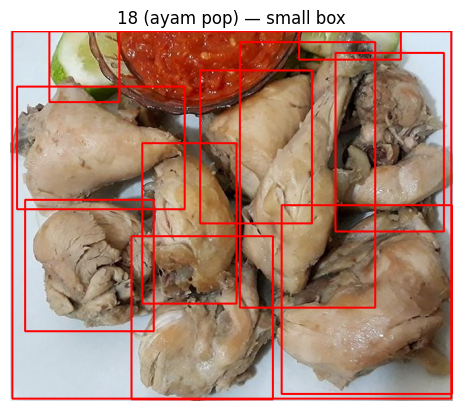

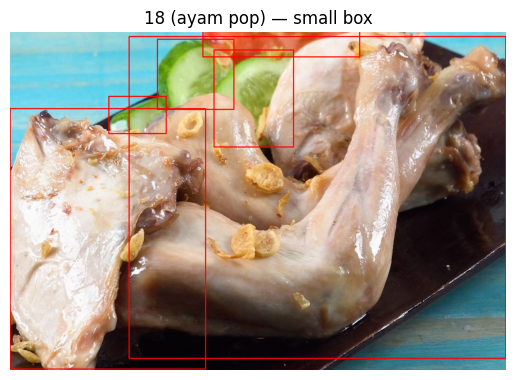

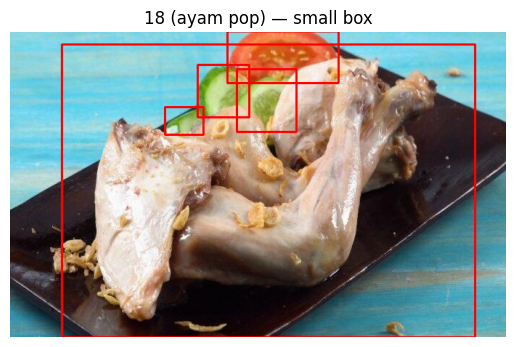

In [34]:
shown = 0
SMALL_BOX_THRESHOLD = 0.02

for cls in DATASET_ROOT.iterdir():
    if shown >= MAX_EDGE_CASE_SAMPLES:
        break

    lbl_dir = cls / LABEL_DIR_NAME
    img_dir = cls / "images"
    if not lbl_dir.exists():
        continue

    for lbl in lbl_dir.glob("*.txt"):
        with open(lbl, "r") as f:
            lines = [ln.strip() for ln in f if ln.strip() and len(ln.split()) == 5]

        for ln in lines:
            _, _, _, w, h = map(float, ln.split())
            if w * h < SMALL_BOX_THRESHOLD:
                img_path = img_dir / f"{lbl.stem}.jpg"
                if not img_path.exists():
                    continue

                img = draw_yolo_boxes(img_path, lbl)
                plt.figure()
                plt.imshow(img)
                plt.title(f"{cls.name} — small box")
                plt.axis("off")
                plt.show()

                shown += 1
                break